<a href="https://colab.research.google.com/github/JoshARogers/DATA_340_NLP/blob/main/hw4/HW4_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/19O-g-AbysbYMTTHD70GgkAZX39TBFpz-#scrollTo=WsTd5an4kYMB)

# Homework 4 - Directions and Weights
### Joshua Rogers
### DATA 340-02, Spring 2023
### April 9, 2023

## Q1 (2 points)

Draw the RepealThe19th retweet network. Ensure the graph is legible and pretty:

Edge crossings are minimized

In [ ]:
import networkx as nx
D = nx.DiGraph()
import gzip
import json
with gzip.open('/content/drive/MyDrive/repealthe19th.jsonl.gz', 'rb') as infile:
    for tweet in infile:
        tweet = json.loads(tweet)

        if 'retweeted_status' in tweet:
          retweeter_user = tweet['user_screen_name']
          retweeted_user = tweet['retweeted_status']['user_screen_name']

          if D.has_edge(retweeted_user, retweeter_user):
            D.edges[retweeted_user, retweeter_user]['weight'] +=1
          else: D.add_edge(retweeted_user, retweeter_user,weight = 1)

In [ ]:
D.remove_edges_from(nx.selfloop_edges(D))
D.remove_nodes_from(list(nx.isolates(D)))

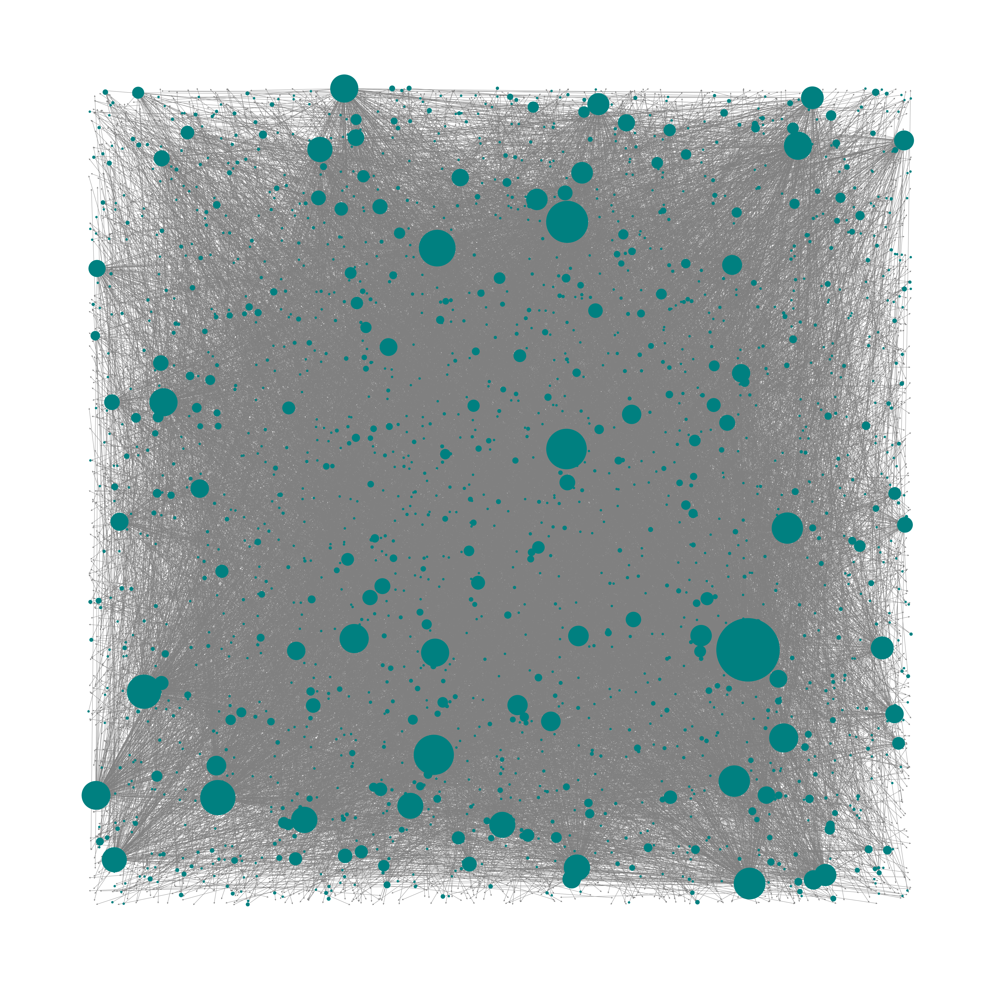

In [ ]:
node_sizes = [D.out_degree(n, weight='weight') * 50 for n in D.nodes]
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(60, 60))
nx.draw_random(D, with_labels = False, node_color = 'teal', edge_color = 'gray', node_size=node_sizes)

#### Discussion 

First, I set node sizes by their edge weight. Then after adjusting the figure size, I adjusted the node and link color, size, etc. I experimented with labels, but it did not look presentable, as having over 14000 labels made things complex. Additionally, I chose the random presentation because the layout is clean, minimizes edge crossings, and prevents nodes stacking upon each other. 

## Q2 (1 point x 6)

### How many nodes are in the retweet network?


#### Answer

In [ ]:
print('The number of nodes in the retweet number is', D.number_of_nodes())

The number of nodes in the retweet number is 14862


#### Discussion

To get the number of nodes in the retweet network, I used networkx's number_of_nodes function to pull the answer.

### How many links are in the retweet network?

#### Answer

In [ ]:
print('The number of links in the retweet number is', D.number_of_edges())

The number of links in the retweet number is 14795


#### Discussion

To get the number of links in the retweet network, I used networkx's number_of_nodes function to pull the answer.

### What is the screen name of the node with highest out-strength in the network? What is its out-strength?

#### Answer

In [ ]:
from operator import itemgetter
sorted(D.out_degree(weight='weight'), key=itemgetter(1), reverse=True)[0]

('Samandjunk', 901)

#### Discussion
I used sorted to list the out_degree. weight = 'weight tells the function to take the edge weight into account. itemgetter tells sorted to sort the values by their value at index 1. lastly, reverse orders the list so the highest values are first (as opposed to (xxx, 0). Lastly, I call for the tuple at index 0, or in other words the first item. This is how we get a tuple of the users name and their out_strength 

### What is the screen name of the node with the second-highest out-strength in the network?

#### Answer

In [ ]:
from operator import itemgetter
sorted(D.out_degree(weight='weight'), key=itemgetter(1), reverse=True)[1]

('m_kaish_esq', 394)

#### Discussion

I used sorted to list the out_degree. weight = 'weight tells the function to take the edge weight into account. itemgetter tells sorted to sort the values by their value at index 1. lastly, reverse orders the list so the highest values are first (as opposed to (xxx, 0). Lastly, I called for the tuple at index 1, or the second item on the list. 

### What is the screen name of the node with highest in-strength in the network? What is its in-strength?

#### Answer

In [ ]:
sorted(D.in_degree(weight='weight'), key=itemgetter(1), reverse=True)[0]

('JenTromans', 48)

#### Discussion

I used sorted to list the in_degree. weight = 'weight tells the function to take the edge weight into account. itemgetter tells sorted to sort the values by their value at index 1. lastly, reverse orders the list so the highest values are first (as opposed to (xxx, 0). Lastly, I called for the item at index 0, or the first item listed. 

### Describe what the out-strength and in-strength values of these accounts tell you about their online behavior.

The in-strength values are a good way to measure the activeness of a user. E.g. JenTromans retweeted 48 tweets related to the hastag, meaning that she was very active on twitter. Out-Strength is a better measure of popularity. Individuals with a high weight mean that a high amount of their tweets get retweeted. 


##Extra-credit (1 point)

How many nodes are in this network’s largest weakly connected component?

#### Answer

In [ ]:
len(max(nx.weakly_connected_components(D), key = len))

11909

#### Discussion

I used Networkx's weakly connected components measure to gather the weak components, then used max to pull the max value, then retrieved the number of nodes by finding the length. 

## References

DATA 340-02 - Chapter 04 - Directions and Weights: https://github.com/anwala/teaching-network-science/blob/main/spring-2023/week-8/data_340_02_s23_chp_04_directions_and_weights.ipynb

Remove selfloops from NetworkX MultiDiGraph causes runtime error (Stack Overflow): https://stackoverflow.com/questions/52528417/remove-selfloops-from-networkx-multidigraph-causes-runtime-error

Networkx - Fraction of nodes in the largest weakly connected component (Stack Overflow): https://stackoverflow.com/questions/70444458/networkx-fraction-of-nodes-in-the-largest-weakly-connected-component